# Prediction of Cellular Composition using CNNs
In this assignment, the objective is to develop a regression model for predicting the number of six different types of cells in a given histological image patch as well as the total number of cells in the image patch


---
## Data Loading + initial analysis of the dataset

In [1]:
import numpy as np
import pandas as pd
from os.path import join as join
import matplotlib.pyplot as plt

In [146]:
# data loading
data_dir = '../data'  # change for your datafiles

X = np.load(join(data_dir,"images.npy"))     # read images
Y = pd.read_csv(join(data_dir,'counts.csv')) # read cell counts
F = np.loadtxt(join(data_dir,'split.txt'), dtype=np.int)   # read fold information
print(f"Image shape: {X.shape}"); print(f"Labels shape: {Y.shape}"); print(f"Split shape: {F.shape}")

# changing the column names to T1, T2, T3, T4, T5, T6
Ts = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6']
T2name, name2T = dict(zip(Ts, Y.columns)), dict(zip(Y.columns, Ts))
Y.columns = Ts
Ydf = Y.copy()   # creating Y dataframe with fold and total count information
Ydf['total'] = Y.T1 + Y.T2 + Y.T3 + Y.T4 + Y.T5 + Y.T6  # adding the total count column
Ydf['fold'] = F  # adding the fold column

Image shape: (4981, 256, 256, 3)
Labels shape: (4981, 6)
Split shape: (4981,)


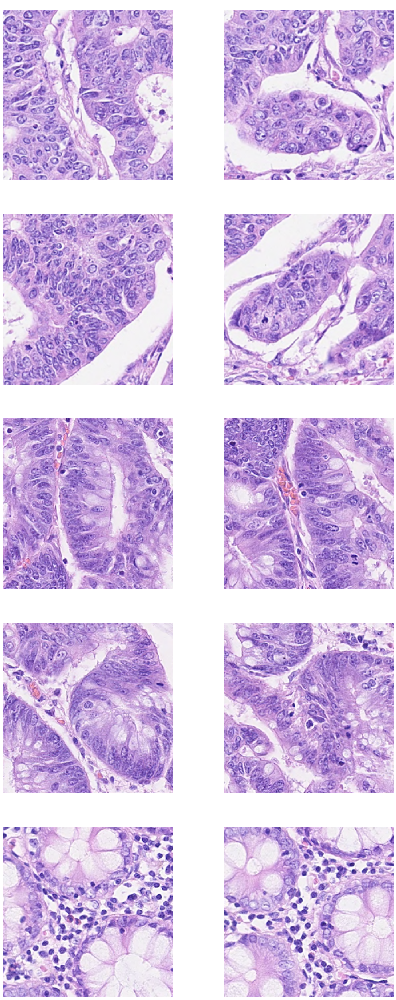

In [147]:
# display first ten images
fig = plt.figure(figsize=(20, 50))

# setting values to rows and column variables
rows = 5
columns = 2

for i in range(rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(X[i])
    plt.title(str(Y.iloc[i,:].values), color = 'white', fontsize=20)
    plt.axis('off')

---
## Question 1: Data Analysis
i. &emsp;&nbsp;   How many examples are there in each fold?
   * There are 1622 examples in fold 1
   * There are 1751 examples in fold 2
   * There are 1608 examples in fold 3
   * There are 4981 examples in total

ii. &emsp;  Show some image examples using plt.imshow. Describe your observations on what you
see in the images and how it correlates with the cell counts of different types of cells and the
overall number of cells.
   * We can see images of tissue with different cell composition with components of different shapes and colors
   * It seems that a cell type (T1, T2,...) is characterised by both its color and its shape, for instance:
      *  T3 (lymphocyte) is very dark and round while T2 (epithelial) is lighter in colour, usually has a brighter center and does not have to be round
      * T5 is associated with the redder shade
      *  T6 is associated with elongated shape
   * It is important to note that some types of cells (T2, T3) are much more common than others. The maximal counts can differ in order of magnitude
   * It seems that the images vary in shade: some images tend to be much brighter than others -> this might be a complication
   * Overall, the images demonstrate how hard task the regression on cellular composition is: the model has to be able to segment and classify the indivudal cells which seems to be rather complicated task, as the differences seem to be quite small between some types.
   * it is clear the overall number of cells is correlated with the number/length of edge contours, hence edge detection will probably be helpful with that.

iii. &emsp; For each fold, plot the histogram of counts of each cell type separately as well as the total
number of cells (7 plots in total). How many images have counts within each of the following bins?
* 0-1,&emsp;&emsp;&nbsp; in fold 1: 39,&emsp; in fold 2: 54,&emsp; in fold 3: 57,&emsp; in all folds: 150
* 1-6,&emsp;&emsp;&nbsp; in fold 1: 17,&emsp; in fold 2: 13,&emsp; in fold 3: 31,&emsp; in all folds: 61
* 6-11,&emsp;&nbsp;&nbsp; in fold 1: 15,&emsp; in fold 2: 30,&emsp; in fold 3: 36,&emsp; in all folds: 81
* 11-21,&emsp; in fold 1: 23,&emsp; in fold 2: 51,&emsp; in fold 3: 85,&emsp; in all folds: 159
* 21-31,&emsp; in fold 1: 47,&emsp; in fold 2: 47,&emsp; in fold 3: 90,&emsp; in all folds: 184
* 31-41,&emsp; in fold 1: 43,&emsp; in fold 2: 66,&emsp; in fold 3: 97,&emsp; in all folds: 206
* 41-51,&emsp; in fold 1: 65,&emsp; in fold 2: 107,&emsp; in fold 3: 71,&emsp; in all folds: 243
* 51-61,&emsp; in fold 1: 83,&emsp; in fold 2: 137,&emsp; in fold 3: 105,&emsp; in all folds: 325
* 61-71,&emsp; in fold 1: 94,&emsp; in fold 2: 134,&emsp; in fold 3: 118,&emsp; in all folds: 346
* 71-81,&emsp; in fold 1: 132,&emsp; in fold 2: 135,&emsp; in fold 3: 124,&emsp; in all folds: 391
* 81-91,&emsp; in fold 1: 164,&emsp; in fold 2: 162,&emsp; in fold 3: 133,&emsp; in all folds: 459
* 91-100,&nbsp; in fold 1: 125,&emsp; in fold 2: 143,&emsp; in fold 3: 116,&emsp; in all folds: 384
* $>$100,&nbsp;&nbsp; in fold 1: 775,&emsp; in fold 2: 672,&emsp; in fold 3: 545,&emsp; in all folds: 1992


In [56]:
## i.
# There are 1622 examples in fold 1
# There are 1751 examples in fold 2
# There are 1608 examples in fold 3
# There are 4981 examples in total

n_examples_fold1 = np.count_nonzero(F == 1)
n_examples_fold2 = np.count_nonzero(F == 2)
n_examples_fold3 = np.count_nonzero(F == 3)
n_total = n_examples_fold1 + n_examples_fold2 + n_examples_fold3

print(f"There are {n_examples_fold1} examples in fold 1")
print(f"There are {n_examples_fold2} examples in fold 2")
print(f"There are {n_examples_fold3} examples in fold 3")
print(f"There are {n_total} examples in total")

There are 1622 examples in fold 1
There are 1751 examples in fold 2
There are 1608 examples in fold 3
There are 4981 examples in total


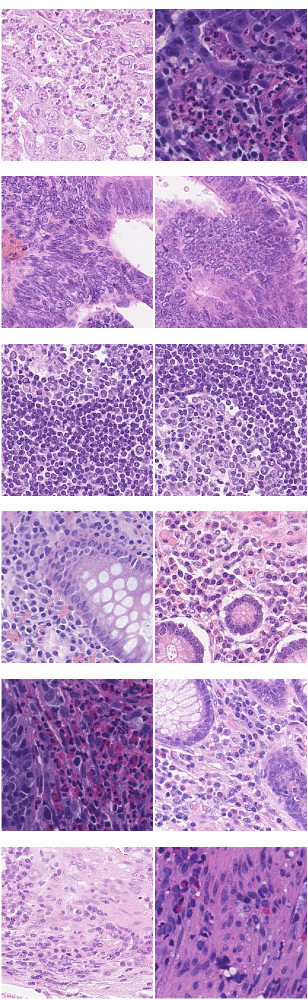

In [148]:
## ii.

# selecting images to which have the most of each cell type
inds = np.zeros(12)
inds[0] = Y[Y.T1 == np.max(Y, axis=1)].sort_values('T1', ascending=False).index[0]
inds[1] = Y[Y.T1 == np.max(Y, axis=1)].sort_values('T1', ascending=False).index[1]
inds[2] = Y[Y.T2 == np.max(Y, axis=1)].sort_values('T2', ascending=False).index[0]
inds[3] = Y[Y.T2 == np.max(Y, axis=1)].sort_values('T2', ascending=False).index[1]
inds[4] = Y[Y.T3 == np.max(Y, axis=1)].sort_values('T3', ascending=False).index[0]
inds[5] = Y[Y.T3 == np.max(Y, axis=1)].sort_values('T3', ascending=False).index[1]
inds[6] = Y[Y.T4 == np.max(Y, axis=1)].sort_values('T4', ascending=False).index[0]
inds[7] = Y[Y.T4 == np.max(Y, axis=1)].sort_values('T4', ascending=False).index[1]
inds[8] = Y.sort_values('T5', ascending=False).index[1]
inds[9] = Y.sort_values('T5', ascending=False).index[2]
inds[10] = Y[Y.T6 == np.max(Y, axis=1)].sort_values('T6', ascending=False).index[1]
inds[11] = Y[Y.T6 == np.max(Y, axis=1)].sort_values('T6', ascending=False).index[2]

# display those 6 images
fig = plt.figure(figsize=(20, 65))
rows = 6
columns = 2

for i in range(12):
    ind = int(inds[i])
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(X[ind])
    plt.title(f"{ind}  counts: {Y.iloc[ind,:].values}", color = 'white', fontsize=35)
    plt.axis('off')
plt.tight_layout()
plt.show()



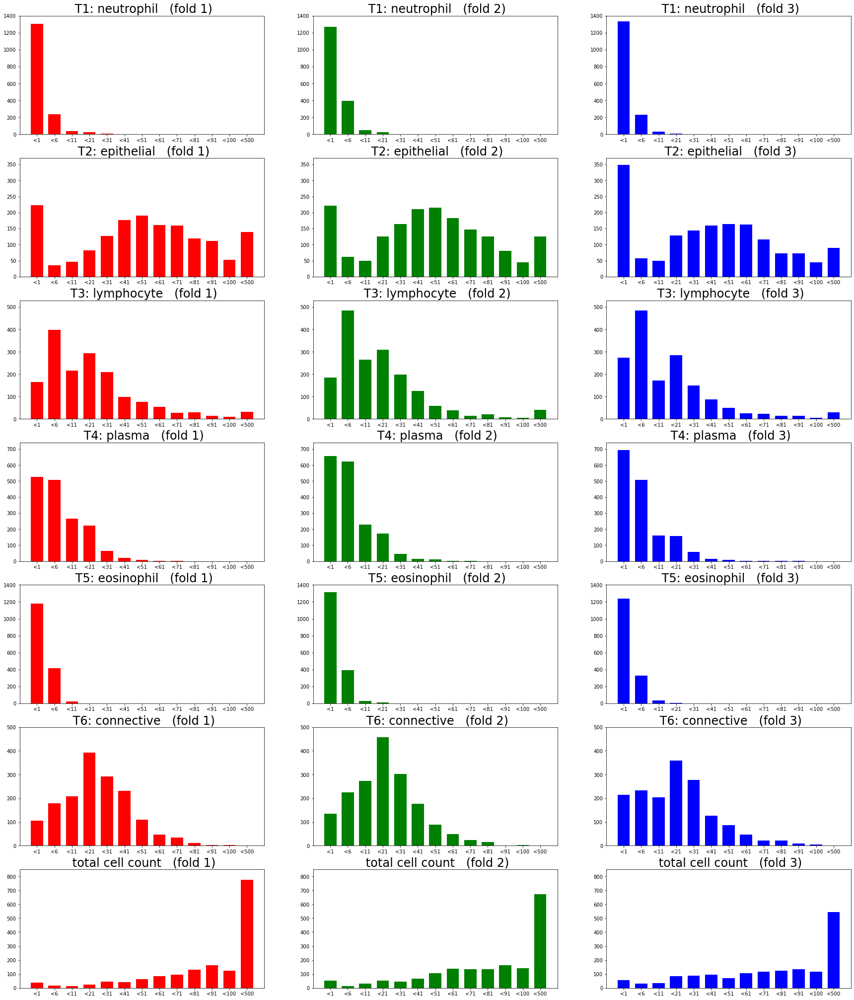

Total cell counts by range
 range 	 fold 1 count	 fold 2 count	 fold 3 count	 total count
 0-1	  in fold 1: 39	 in fold 2: 54	 in fold 3: 57	 in all folds: 150
 1-6	  in fold 1: 17	 in fold 2: 13	 in fold 3: 31	 in all folds: 61
 6-11	  in fold 1: 15	 in fold 2: 30	 in fold 3: 36	 in all folds: 81
 11-21	  in fold 1: 23	 in fold 2: 51	 in fold 3: 85	 in all folds: 159
 21-31	  in fold 1: 47	 in fold 2: 47	 in fold 3: 90	 in all folds: 184
 31-41	  in fold 1: 43	 in fold 2: 66	 in fold 3: 97	 in all folds: 206
 41-51	  in fold 1: 65	 in fold 2: 107	 in fold 3: 71	 in all folds: 243
 51-61	  in fold 1: 83	 in fold 2: 137	 in fold 3: 105	 in all folds: 325
 61-71	  in fold 1: 94	 in fold 2: 134	 in fold 3: 118	 in all folds: 346
 71-81	  in fold 1: 132	 in fold 2: 135	 in fold 3: 124	 in all folds: 391
 81-91	  in fold 1: 164	 in fold 2: 162	 in fold 3: 133	 in all folds: 459
 91-100	  in fold 1: 125	 in fold 2: 143	 in fold 3: 116	 in all folds: 384
 >100 	  in fold 1: 775	 in fold 2: 67

In [210]:
## iii.
# plotting fold 1 in red, fold 2 in green and fold 3 in blue

f, a = plt.subplots (7,3, figsize=(30,36))
bins = [0,1,6,11,21,31,41,51,61,71,81,91,100, 500]  # largest possible count is 455 < 500
labs = ['<'+str(n) for n in bins[1:]]
cols = ['red', 'green', 'blue']
titles = [t + ': ' + name for t, name in T2name.items()]; titles.append("total cell count")
ranges = [1400, 370, 530, 740, 1400, 500, 850]
total_sums = [0,0,0]
for fold in [1, 2, 3]:
    df = Ydf[Ydf.fold == fold]  # fold dataframe
    for column in range(7):
        column_count = df.iloc[:,column]
        hist, edges = np.histogram(column_count, bins=bins)  # get the histogram counts

        a[column, fold-1].bar(np.arange(hist.shape[0]), hist, width=0.7, color=cols[fold-1])
        a[column, fold-1].set_xticks(ticks=np.arange(hist.shape[0]))
        a[column, fold-1].set_xticklabels(labels=labs)
        a[column, fold-1].set_ylim((0,ranges[column]))
        a[column, fold-1].set_title(f" {titles[column]}   (fold {str(fold)})", fontsize=24)
        if column == 6:
            total_sums[fold-1] = hist
plt.show()


# calculate the nubers of images with counts within the specified bins
print("Total cell counts by range\n range \t fold 1 count\t fold 2 count\t fold 3 count\t total count")
total_all_folds = np.sum(total_sums, axis=0)

for i in range(len(total_sums[0])-1):
    print(f" {bins[i]}-{bins[i+1]}\t  in fold 1: {total_sums[0][i]}\t in fold 2: {total_sums[1][i]}\t in fold 3: {total_sums[2][i]}\t in all folds: {total_all_folds[i]}")
print(f" >100 \t  in fold 1: {total_sums[0][-1]}\t in fold 2: {total_sums[1][-1]}\t in fold 3: {total_sums[2][-1]}\t in all folds: {total_all_folds[-1]}")

---
## Question 2: (Feature Extraction and Classical Regression)

---
## Question 3: Using Convolutional Neural Networks

---
## Question 1: Data Analysis


---
## Question 2: (Feature Extraction and Classical Regression)

---
## Question 3: Using Convolutional Neural Networks